In [2]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.axes
import numpy as np
from scipy import signal
from typing import Callable
import heapq
import sys
import types

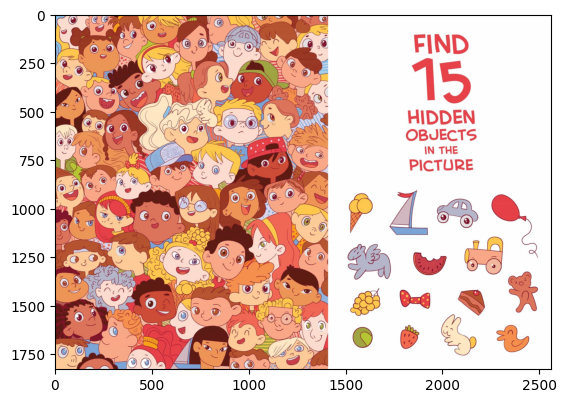

In [3]:
img = cv2.imread("1.jpg")
img = img[:, :]
# img = img.astype(np.float32)
# img = (img / 255.0).astype(np.float32)
plt.imshow(img[:, :, ::-1])

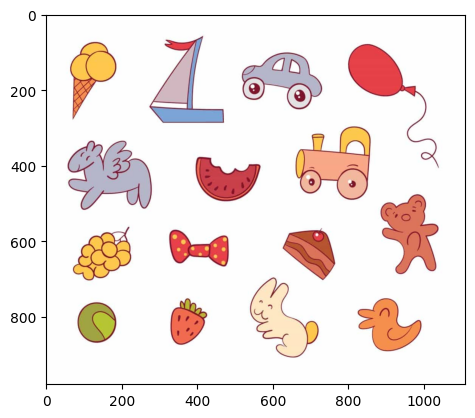

In [4]:
OBJECT_IMG = img[850:, 1450:]
TARGET_IMG = img[:, :1400]
plt.imshow(OBJECT_IMG[:, :, ::-1])
plt.show()
# plt.imshow(target_img, cmap="gray")
# plt.show()

In [5]:
def greater(value1: int | np.ndarray, value2: int | np.ndarray):
    if isinstance(value1, np.ndarray):
        for i in range(len(value1)):
            if (value1[i] != value2[i]):
                return value1[i] > value2[i]
    return value1 > value2
        
def extract_single(object_img: np.ndarray, threshold: int = 0, step: int = 4):
    # print(object_img[0, 0])
    img_h, img_w = object_img.shape[:2]
    detected_x = -1
    detected_y = -1
    for x in range(img_w):
        for y in range(img_h):
            if not greater(object_img[y, x], threshold):
                detected_x = x
                detected_y = y
                break
        if detected_x != -1:
            break
    left_x = detected_x
    right_x = detected_x
    up_y = detected_y
    down_y = detected_y
    def check_complete(left: int, right: int, up: int, down: int):
        line1 = object_img[up, left:right]
        line2 = object_img[down, left:right]
        line3 = object_img[up:down, left]
        line4 = object_img[up:down, right]
        border = list(line1) + list(line2) + list(line3) + list(line4)
        if len(border) == 0: return False
        return all(greater(v, threshold) for v in border)
    interation = 0
    while not check_complete(left_x, right_x, up_y, down_y):
        if interation == 0 or not all(greater(v, threshold) for v in object_img[up_y:down_y, left_x]):
            while True:
                left_x = max(0, left_x-step)
                if left_x == 0: break
                slice = object_img[up_y:down_y, left_x-step:left_x]
                if len(slice.shape) == 3:
                    arr_range = list(slice.reshape(-1, slice.shape[-1]))
                else:
                    arr_range = list(slice.flatten())
                if all(greater(v, threshold) for v in arr_range): break
        if interation == 0 or not all(greater(v, threshold) for v in object_img[up_y:down_y, right_x]):
            while True:
                right_x = min(img_w-1, right_x+step)
                if right_x == img_w - 1: break
                slice = object_img[up_y:down_y, right_x:right_x+step]
                if len(slice.shape) == 3:
                    arr_range = list(slice.reshape(-1, slice.shape[-1]))
                else:
                    arr_range = list(slice.flatten())
                try:
                    if all(greater(v, threshold) for v in arr_range): break
                except:
                    print(threshold, arr_range)
        if interation == 0 or not all(greater(v, threshold) for v in object_img[up_y, left_x:right_x]):
            while True:
                up_y = max(0, up_y-step)
                if up_y == 0: break
                slice = object_img[up_y-step:up_y, left_x:right_x]
                if len(slice.shape) == 3:
                    arr_range = list(slice.reshape(-1, slice.shape[-1]))
                else:
                    arr_range = list(slice.flatten())
                if all(greater(v, threshold) for v in arr_range): break
        if interation == 0 or  not all(greater(v, threshold) for v in object_img[down_y, left_x:right_x]):
            while True:
                down_y = min(img_h-1, down_y+step)
                if down_y == img_h - 1: break
                slice = object_img[down_y:down_y+step, left_x:right_x]
                if len(slice.shape) == 3:
                    arr_range = list(slice.reshape(-1, slice.shape[-1]))
                else:
                    arr_range = list(slice.flatten())
                if all(greater(v, threshold) for v in arr_range): break
        interation += 1
        if interation > 100: break
    print(interation, left_x, up_y, right_x, down_y)
    return object_img[up_y:down_y, left_x:right_x], (left_x, right_x, up_y, down_y)
def extract(object_image: np.ndarray, threshold: int = 0, step: int = 4, amount: int = 15):
    img = object_image.copy().astype(np.int32)
    object_images: list[np.ndarray] = []
    for _ in range(amount):
        object_img, (left, right, up, down) = extract_single(img, threshold, step)
        object_images.append(object_img.copy())
        img[up:down, left:right] = 255
    return object_images

3 48 326 280 526
2 55 68 191 284
3 63 558 231 710
2 75 756 187 876
2 265 51 473 291
2 317 568 485 672
3 319 742 431 878
2 387 371 571 499
(230, 230, 230) [array([254, 253, 255]), array([254, 251, 253]), array([249, 246, 248]), array([255, 254, 255]), array([254, 255, 251]), array([247, 251, 239]), array([255, 255, 247]), array([230, 230, 230]), array([254, 252, 255]), array([254, 250, 255]), array([248, 245, 247]), array([255, 254, 255]), array([255, 255, 254]), array([250, 254, 243]), array([255, 255, 249]), array([238, 237, 241]), array([254, 251, 255]), array([255, 252, 255]), array([246, 242, 247]), array([255, 254, 255]), array([255, 255, 255]), array([252, 255, 246]), array([255, 255, 251]), array([245, 243, 249]), array([254, 253, 255]), array([255, 253, 255]), array([245, 242, 244]), array([255, 254, 255]), array([255, 255, 255]), array([252, 253, 249]), array([255, 255, 254]), array([249, 245, 255]), array([254, 254, 254]), array([255, 255, 255]), array([245, 242, 244]), array

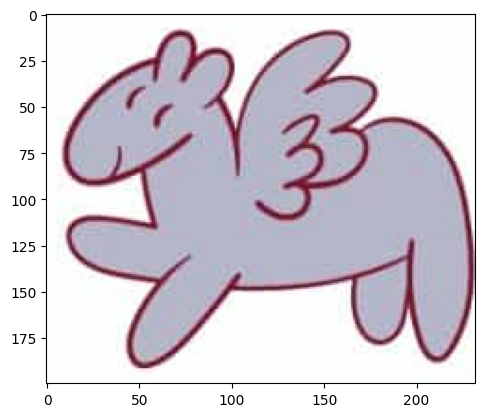

(216, 136, 3)


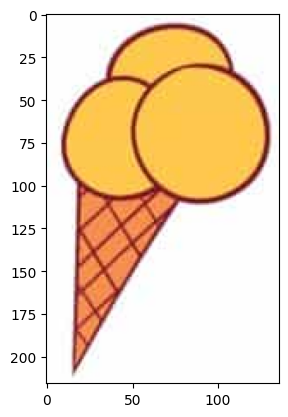

(152, 168, 3)


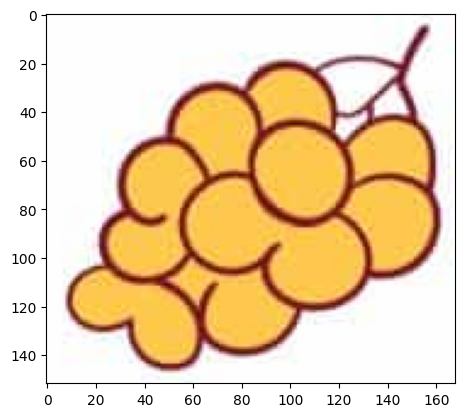

(120, 112, 3)


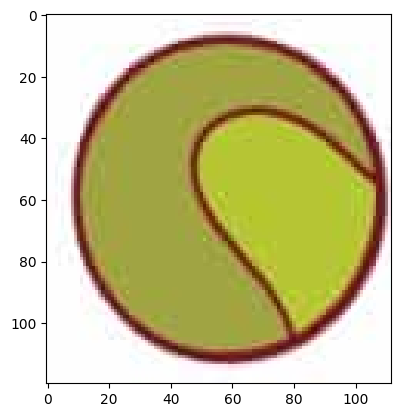

(240, 208, 3)


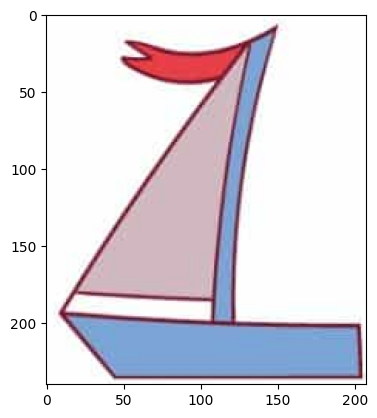

(104, 168, 3)


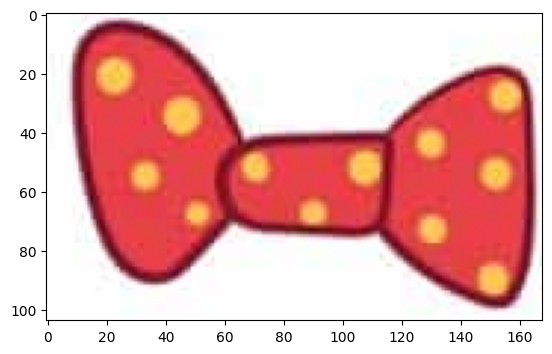

(136, 112, 3)


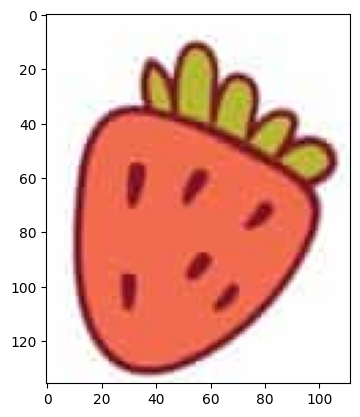

(128, 184, 3)


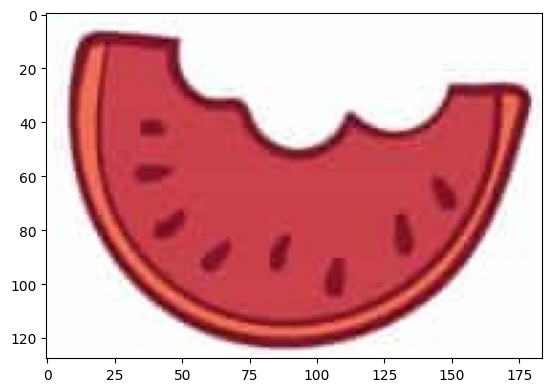

(160, 224, 3)


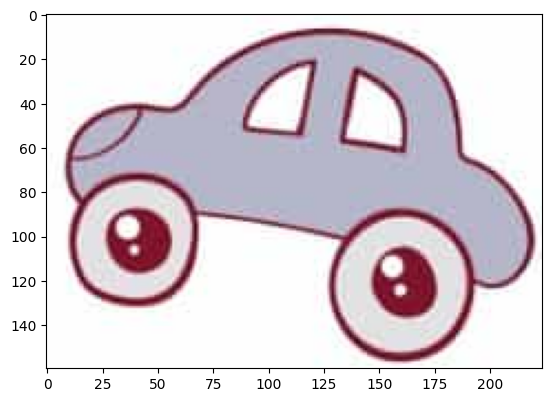

(352, 240, 3)


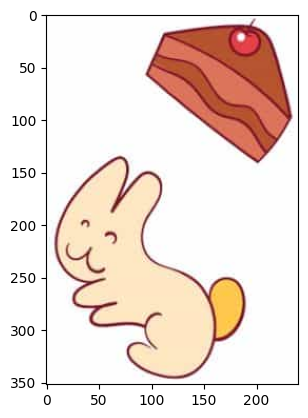

(200, 208, 3)


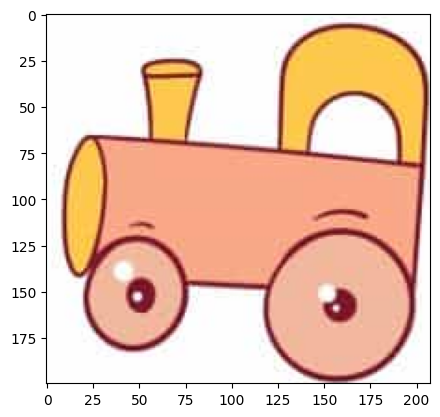

(336, 248, 3)


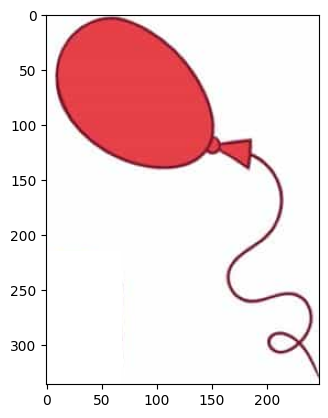

(152, 184, 3)


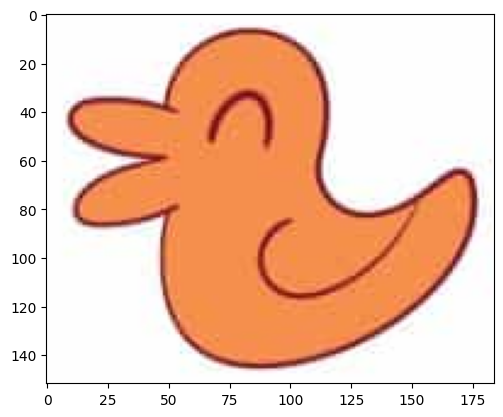

(224, 168, 3)


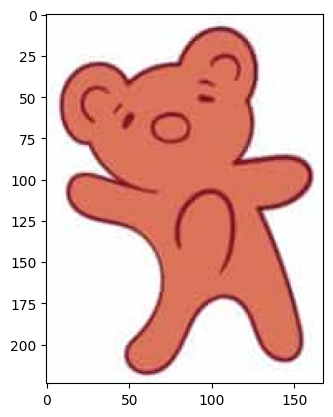

In [6]:
# extracted_img, _ = extract_single(OBJECT_IMG.astype(np.int32), 250, 4)
OBJECT_IMGS = extract(OBJECT_IMG, (230, 230, 230), 8, 14)
for extracted_img in OBJECT_IMGS:
    print(extracted_img.shape)
    plt.imshow(extracted_img[:, :, ::-1])
    plt.show(True)
# for i in range(min(extracted_img.shape[0], 100)):
#     row = ""
#     for j in range(min(extracted_img.shape[1], 100)):
#         row += f"{extracted_img[i, j]} "
#     print(row)

In [7]:
def calculate_histogram(img: np.ndarray, channel: int = None) -> np.ndarray:
    if channel == None:
        b_hist = cv2.calcHist([img.astype(np.uint8)], channels=[0], mask=None, histSize=[256], ranges=[0, 256])
        g_hist = cv2.calcHist([img.astype(np.uint8)], channels=[1], mask=None, histSize=[256], ranges=[0, 256])
        r_hist = cv2.calcHist([img.astype(np.uint8)], channels=[2], mask=None, histSize=[256], ranges=[0, 256])
        return np.hstack((b_hist, g_hist, r_hist))
    else:
        return cv2.calcHist([img.astype(np.uint8)], channels=[channel], mask=None, histSize=[256], ranges=[0, 256])
def extract_mask(img: np.ndarray):
    img = cv2.medianBlur(img.copy()[:, :, 0], 3)
    _, thresh = cv2.threshold(img[:, :], 150, 254, cv2.THRESH_BINARY)
    kernel_size = 3
    thresh = 255-thresh
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_size, kernel_size))
    erode = cv2.erode(thresh, kernel, iterations=2)
    border: np.ndarray = erode - thresh
    white_background = border
    cv2.floodFill(white_background, np.zeros((border.shape[0]+2, border.shape[1]+2)).astype(np.uint8), (0, 0), 255)
    return 255-white_background
def cosine_simmilarity_hist_with_mask(patch: np.ndarray, template: np.ndarray, mask: np.ndarray) -> float:
    masked_template = np.zeros_like(template)
    masked_patch = np.zeros_like(patch)
    masked_template[mask] = template[mask]
    masked_patch[mask] = patch[mask]
    flat1 = calculate_histogram(masked_template)[1:].flatten()
    flat2 = calculate_histogram(masked_patch)[1:].flatten()
    return np.dot(flat1, flat2) / (np.linalg.norm(flat1) * np.linalg.norm(flat2))
def cosine_simmilarity_hist_with_mask_gray(patch: np.ndarray, template: np.ndarray, mask: np.ndarray) -> float:
    masked_template = np.zeros_like(template)
    masked_patch = np.zeros_like(patch)
    masked_template[mask] = template[mask]
    masked_patch[mask] = patch[mask]
    flat1 = calculate_histogram(masked_template, 0)[1:].flatten()
    flat2 = calculate_histogram(masked_patch, 0)[1:].flatten()
    return np.dot(flat1, flat2) / (np.linalg.norm(flat1) * np.linalg.norm(flat2))
def convl_simmilarity_with_mask(patch: np.ndarray, template: np.ndarray, mask: np.ndarray) -> float:
    masked_template = np.zeros_like(template)
    masked_patch = np.zeros_like(patch)
    masked_template[mask] = template[mask]
    masked_patch[mask] = patch[mask]
    result = (masked_patch * masked_template).sum()
    return result
def convl_simmilarity_with_mask_normalized(patch: np.ndarray, template: np.ndarray, mask: np.ndarray) -> float:
    masked_template = np.zeros_like(template)
    masked_patch = np.zeros_like(patch)
    masked_template[mask] = template[mask]
    masked_patch[mask] = patch[mask]
    img_h, img_w = patch.shape[:2]
    kernel_h, kernel_w = masked_template.shape[:2]
    result_h, result_w = (img_h-kernel_h+1, img_w-kernel_w+1)
    result = np.zeros((result_h, result_w))
    def normalize(patch: np.ndarray) -> np.ndarray:
        mean = patch.mean()
        return patch - mean
    result = (normalize(masked_patch[:, :, 0]) * normalize(masked_template[:, :, 0])).sum()
    return result

In [8]:
def compute(img: np.ndarray, template: np.ndarray, mask: np.ndarray, stride: int):
    img_h, img_w = img.shape[:2]
    temp_h, temp_w = template.shape[:2]
    res_h = (img_h-temp_h)//stride + 1
    res_w = (img_w-temp_w)//stride + 1
    result = np.zeros((res_h, res_w))
    for y in range(res_h):
        for x in range(res_w):
            patch = img[y*stride:y*stride + temp_h, x*stride:x*stride + temp_w]
            # print(f"{patch.shape} {template.shape}")
            simmilarity = cosine_simmilarity_hist_with_mask(patch, template, mask)
            result[y, x] = simmilarity
    return result
def detect_area(mask: np.ndarray, region_size: tuple[int, int], region_pad: tuple[int, int] = (0, 0), num_result: int = 1, is_min: bool = True):
    local_mask = mask.copy()
    if not is_min:
        local_mask *= -1
    detected_mask = np.zeros_like(mask).astype(bool)
    detected_mask[:, :] = False
    pq = []
    mask_h, mask_w = mask.shape[:2]    
    for y in range(mask_h):
        for x in range(mask_w):
            heapq.heappush(pq, (local_mask[y, x], (y, x)))
    result = []
    while len(pq) > 0 and len(result) < num_result:
        _, (y, x) = heapq.heappop(pq)
        if detected_mask[y, x]: continue
        # print(_, y , x)
        detected_mask[max(0, y-region_pad[0]): min(mask_h-1, y+region_size[0]+region_pad[0]), max(0, x-region_pad[1]): min(mask_w-1, x+region_size[1]+region_pad[1])] = True
        result.append((y, x))
    return result

In [9]:
def draw_bound(img: np.ndarray, top: int, down: int, left: int, right: int, size: int, color: int | np.ndarray):
    img[top:down, left-size//2:left+size//2] = color
    img[top:down, right-size//2:right+size//2] = color
    img[top-size//2:top+size//2, left:right] = color
    img[down-size//2:down+size//2, left:right] = color
    return img
def hijack_call(frame: types.FrameType, event: str, arg):
    if event == "call" and "simmilarity" in frame.f_code.co_name:
        def trace_locals(inner_frame: types.FrameType, event: str, arg):
            if event == "return":
                _, axes = plt.subplots(1, 2, figsize=(9, 4))
                axes: list[matplotlib.axes.Axes]
                axes[0].imshow(inner_frame.f_locals.get("masked_template")[:, :, ::-1])
                axes[1].imshow(inner_frame.f_locals.get("masked_patch")[:, :, ::-1])
                plt.show(True)
            return trace_locals
        return trace_locals
    return None
def process_single_object(img: np.ndarray, template: np.ndarray, mask: np.ndarray, stride: int):
    hist = calculate_histogram(template)
    result = compute(img, template, mask, stride)
    region_size = (template.shape[0]//stride, template.shape[1]//stride)
    detected_position = detect_area(result, region_size, region_pad=(32, 32), num_result=1, is_min=False)
    detected_img = img.copy().astype(np.uint8)
    for (y, x) in detected_position:
        up = y*stride
        down = (y+region_size[0])*stride
        left = x*stride
        right = (x+region_size[1])*stride 
        sys.settrace(hijack_call)
        cosine_simmilarity_hist_with_mask(img[up:up+template.shape[0], left:left+template.shape[1]], template, mask)
        sys.settrace(None)
        detected_img = draw_bound(img, up, down, left, right, 4, (0, 0, 0))
    threshold = np.array((254, 254, 254))
    mask = np.all(template != threshold, axis=-1)
    show_template = np.zeros_like(template)
    show_template[mask] = template[mask]
    
    
    _, axes = plt.subplots(1, 2, figsize=(9, 4))
    axes: list[matplotlib.axes.Axes]
    ax_result_heatmap = axes[0]
    ax_result_heatmap.set_title("Result heatmap")
    ax_result_heatmap.axis("off")
    # ax_mask = axes[1]
    # ax_mask.set_title("Mask")
    # ax_mask.axis("off")
    ax_result_detected = axes[1]
    ax_result_detected.set_title("Detected result")
    ax_result_detected.axis("off")
    plt.tight_layout()
    ax_result_heatmap.imshow(result, cmap="gray")
    # ax_mask.imshow(mask.astype(np.uint8), cmap="gray")
    ax_result_detected.imshow(detected_img[:, :, :: -1])

    plt.show(True)

start


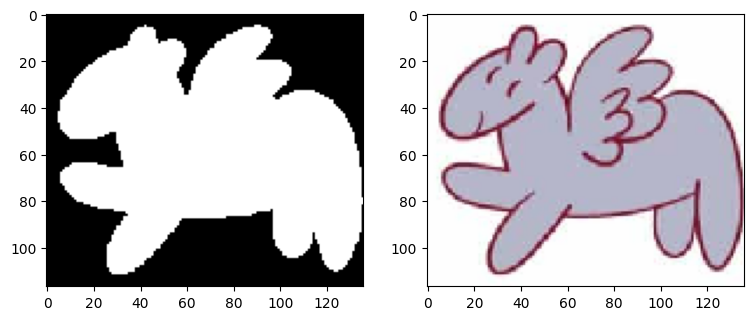

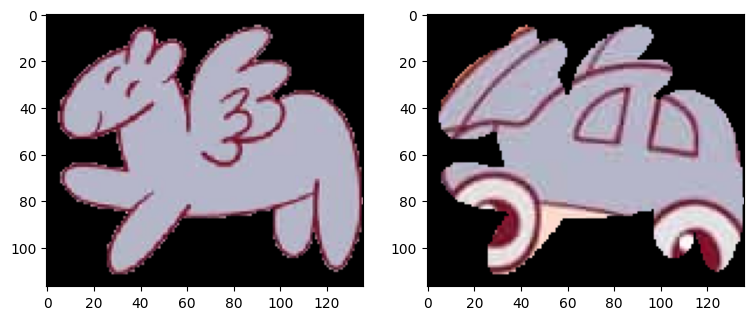

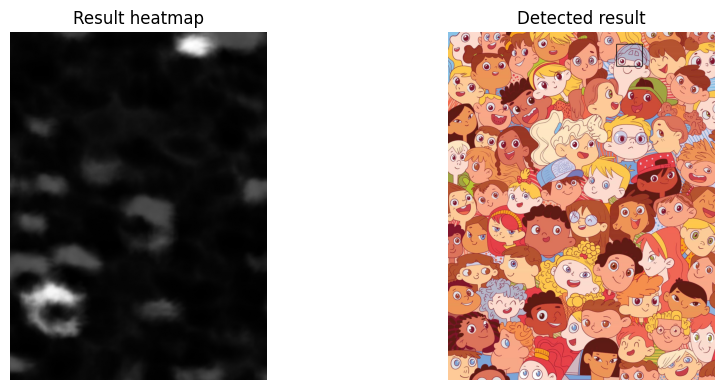

start


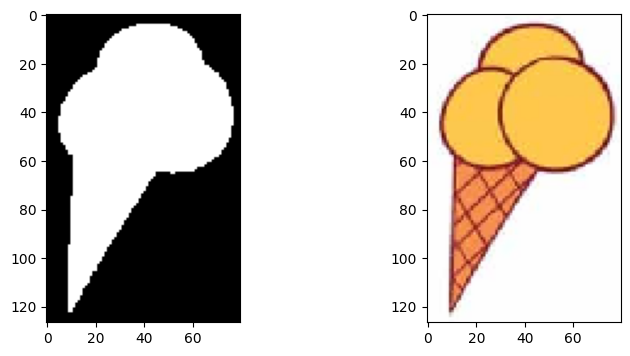

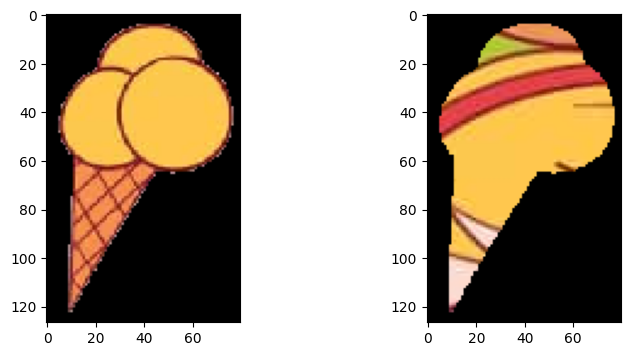

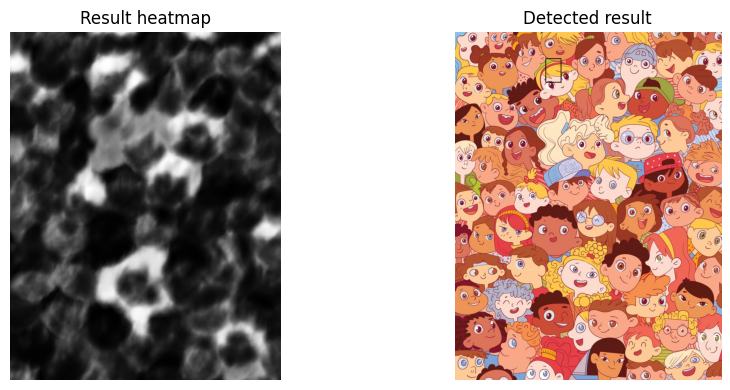

start


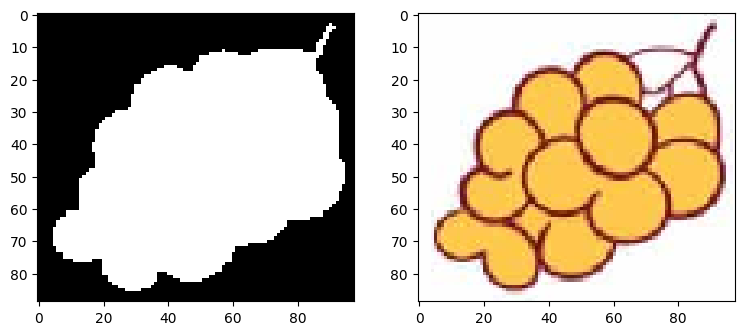

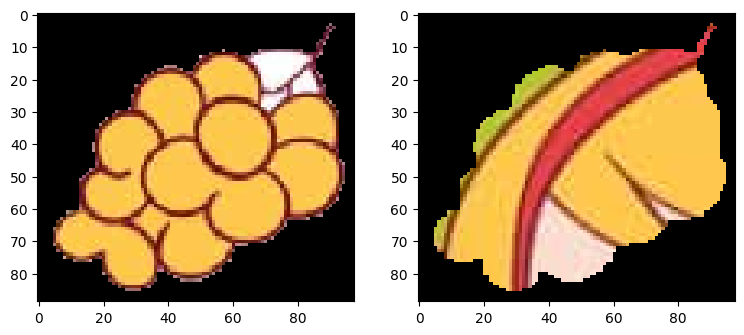

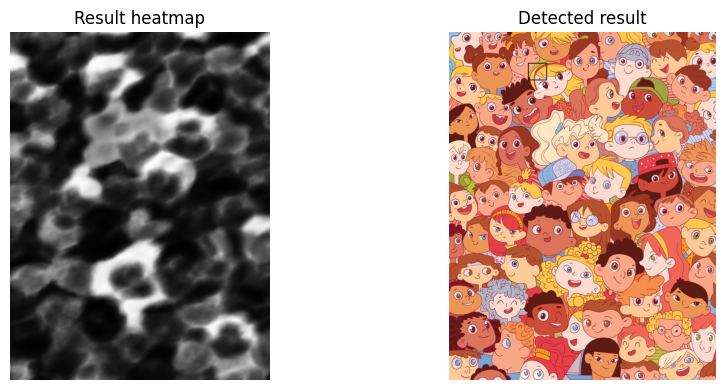

start


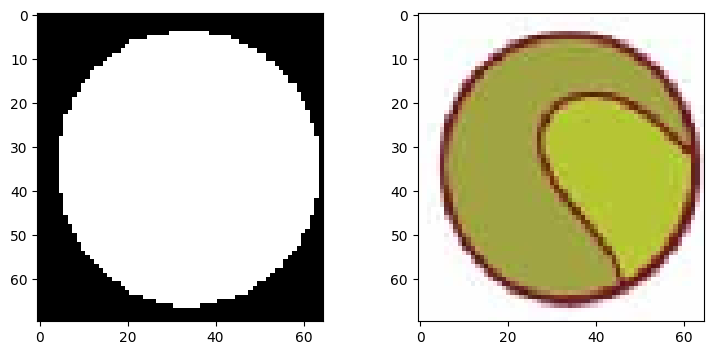

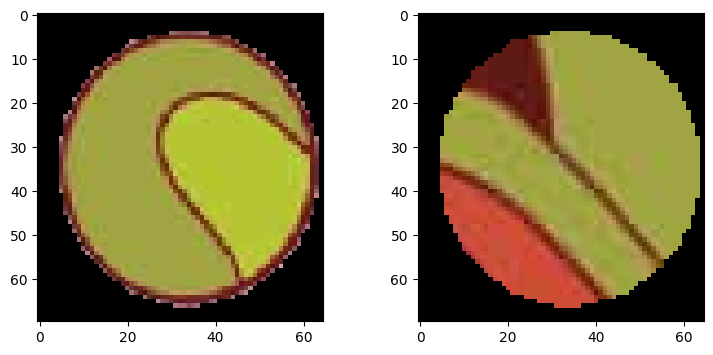

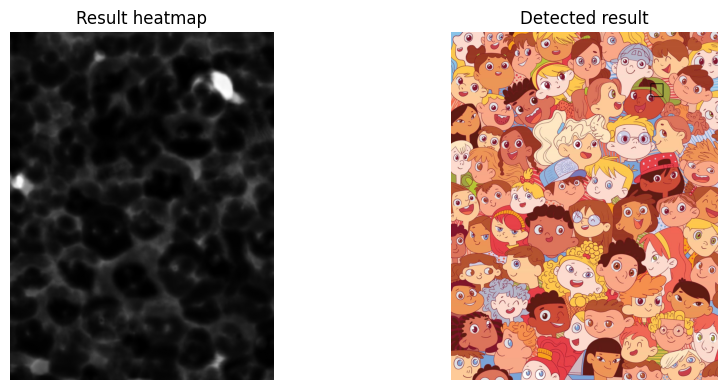

start


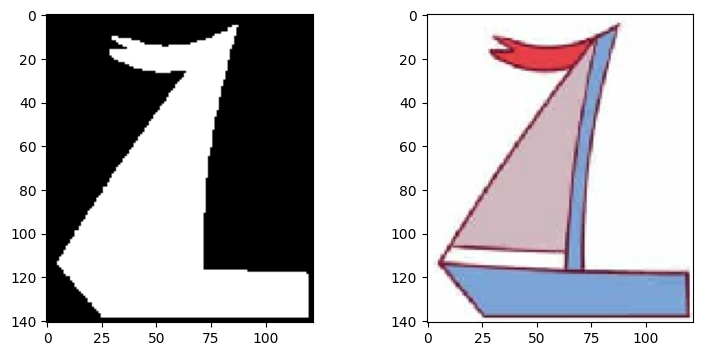

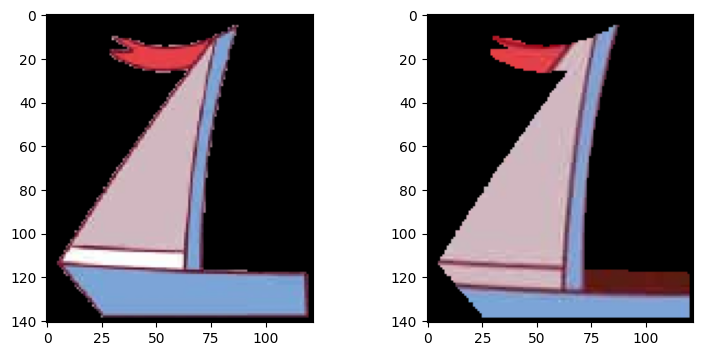

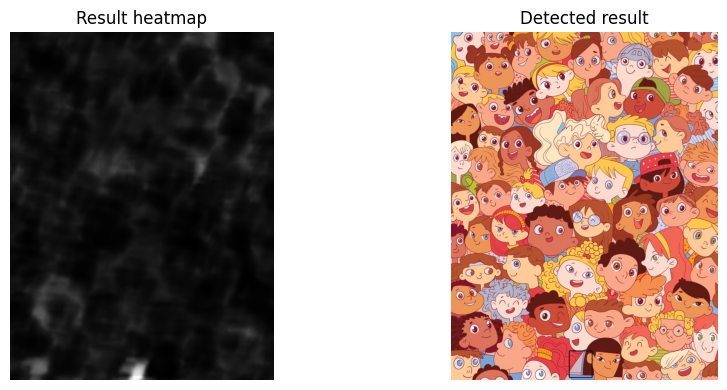

start


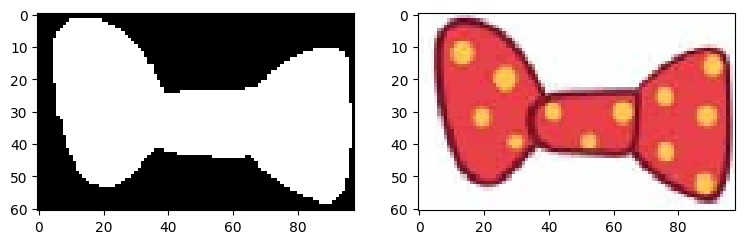

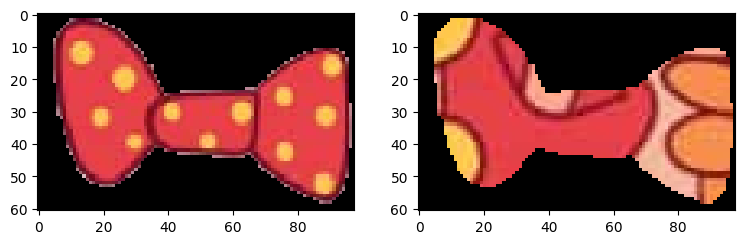

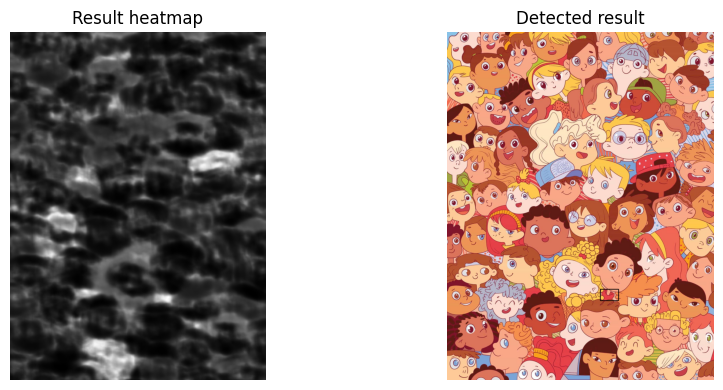

start


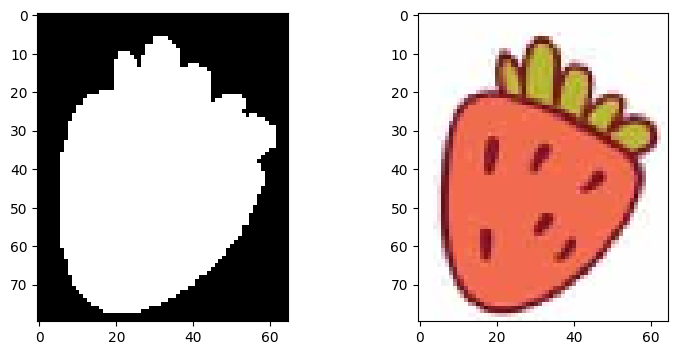

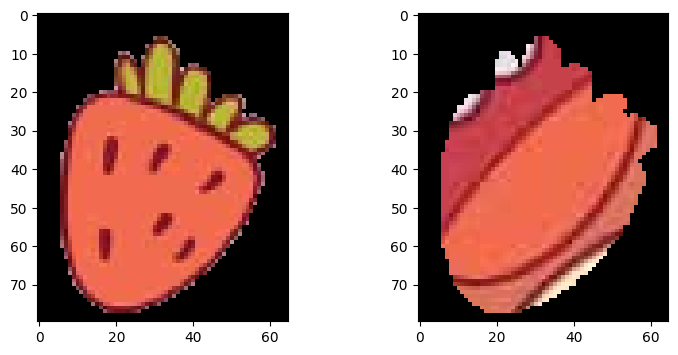

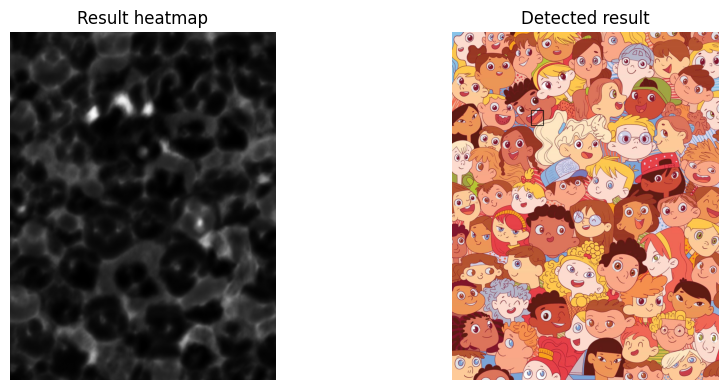

start


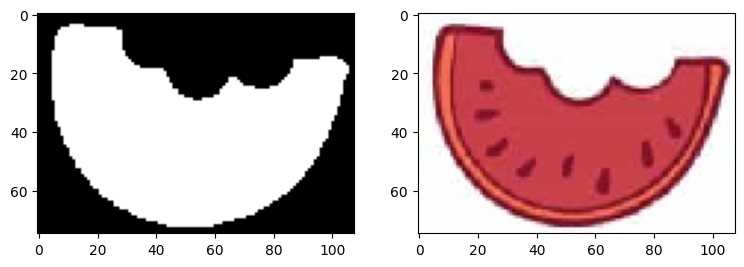

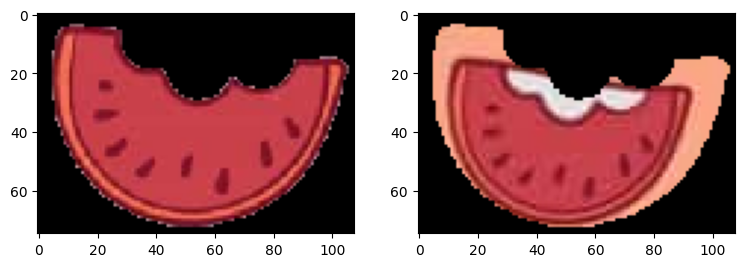

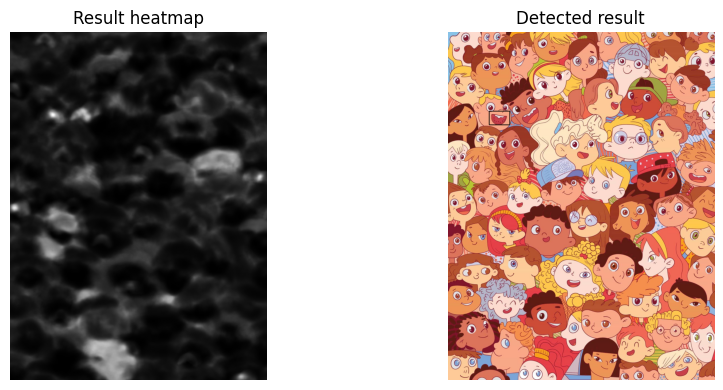

start


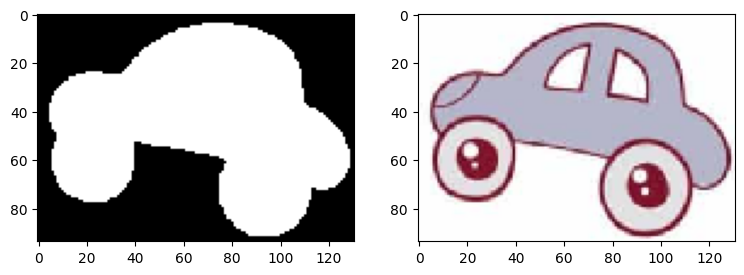

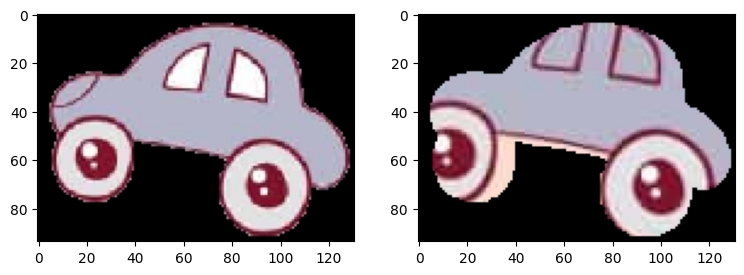

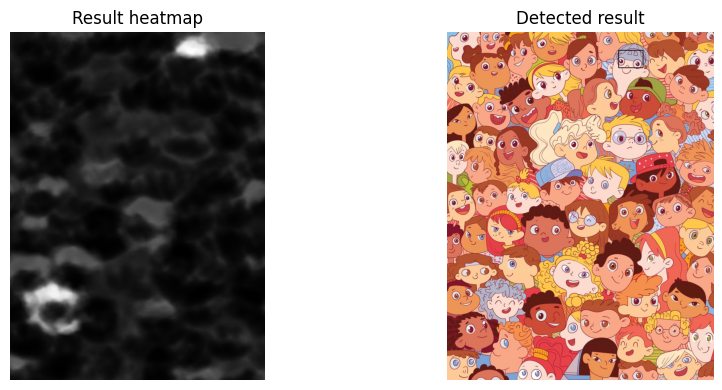

start


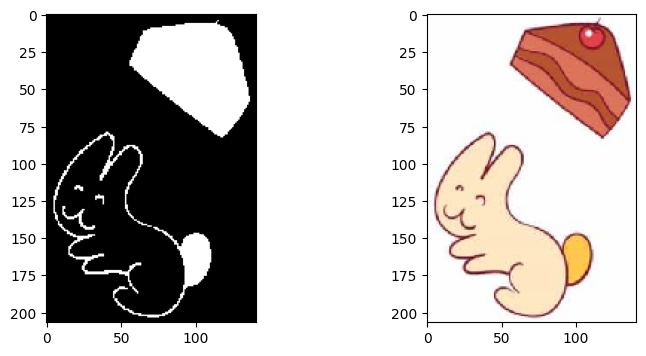

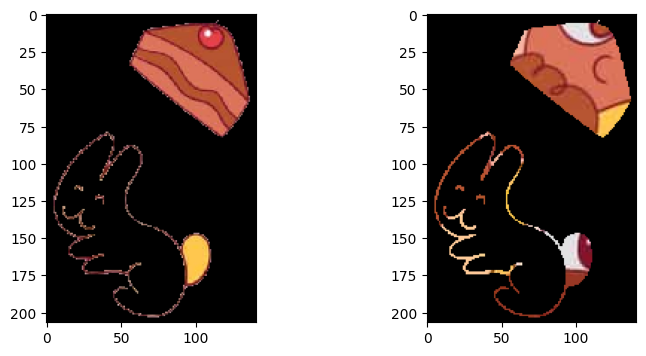

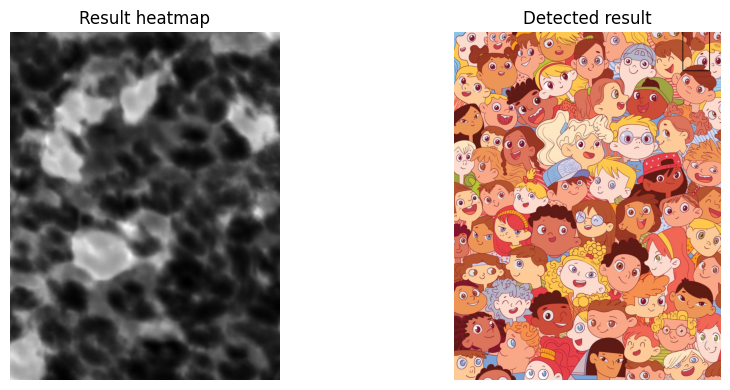

start


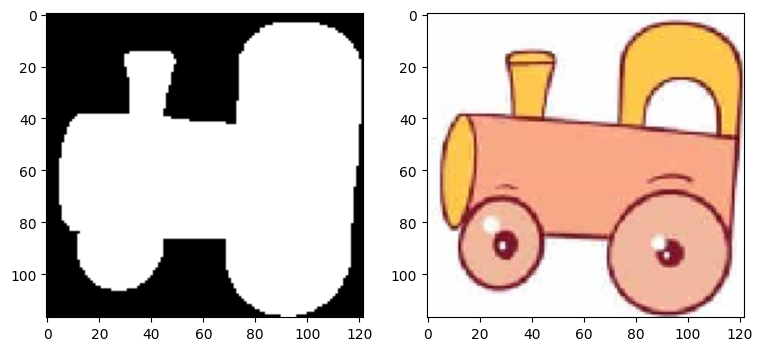

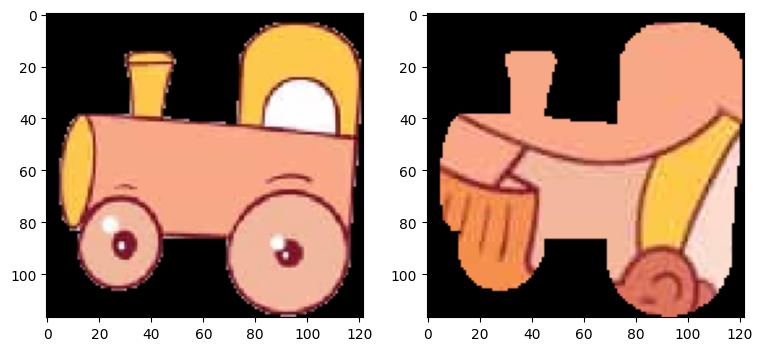

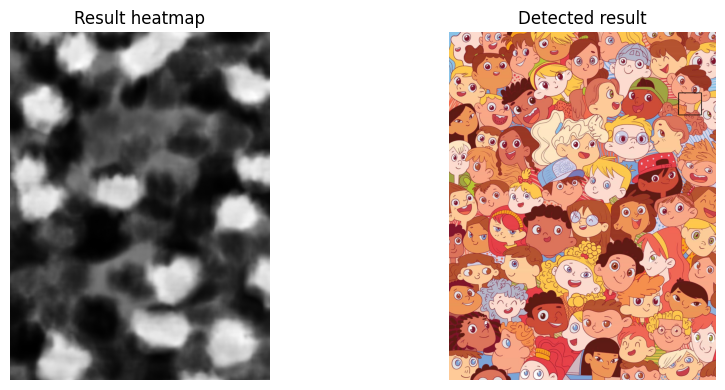

start


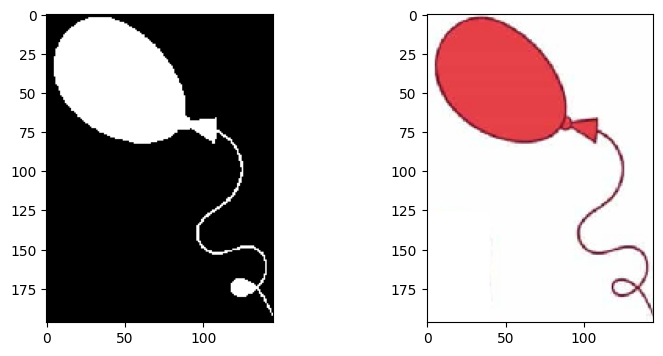

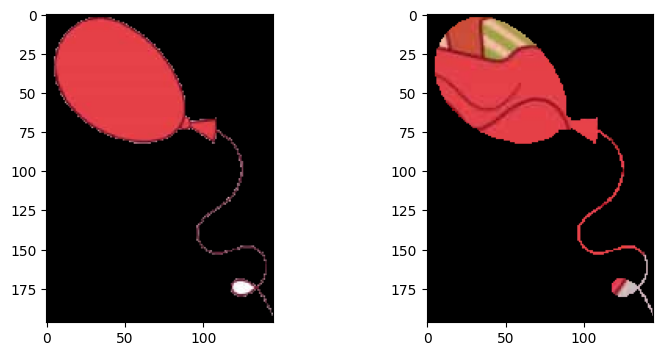

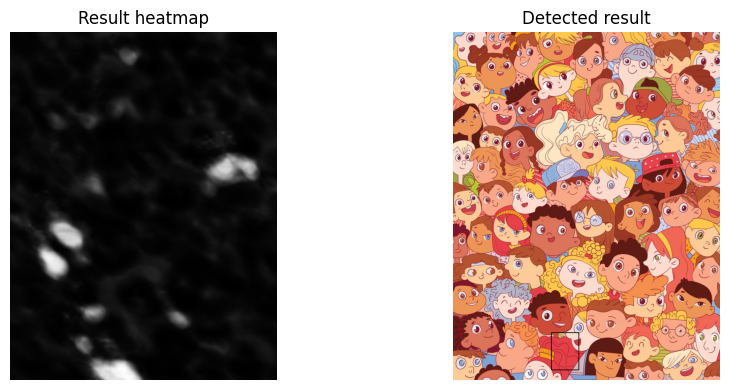

start


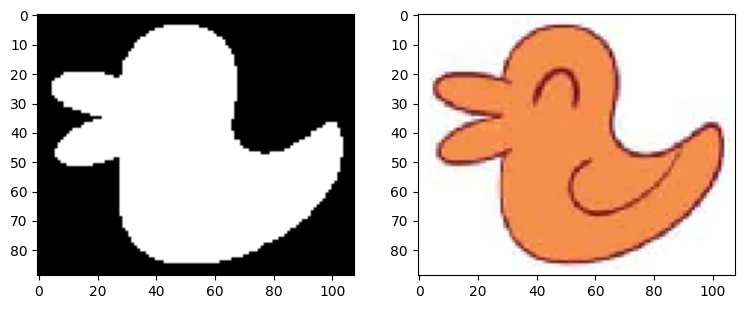

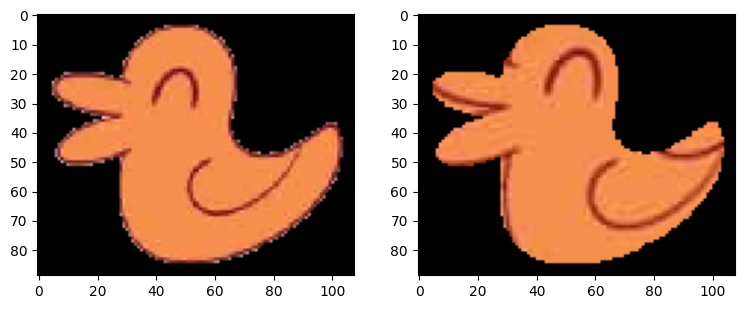

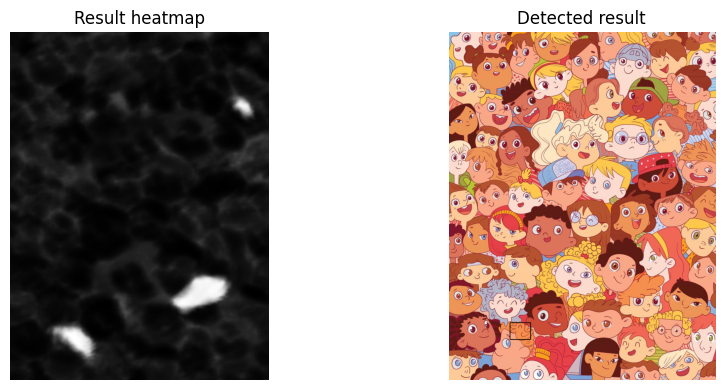

start


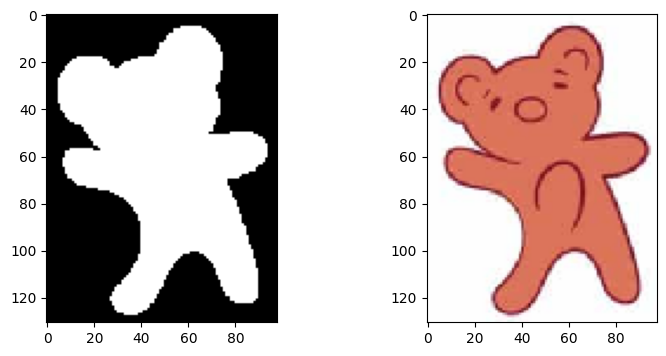

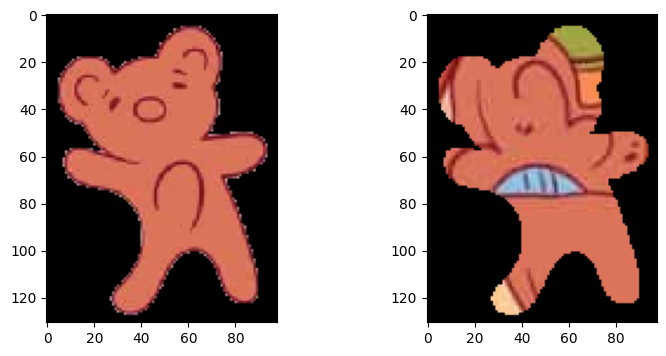

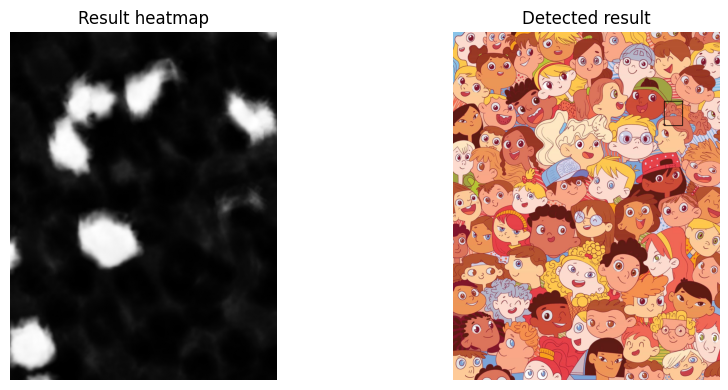

In [10]:
scale = 1.7
for masked_template in OBJECT_IMGS:
    # resized_template = cv2.resize(template.astype(np.uint8), (template.shape[1]//2, template.shape[0]//2), interpolation=cv2.INTER_LINEAR)
    # resized_image = cv2.resize(TARGET_IMG.astype(np.uint8), (TARGET_IMG.shape[1]*2, TARGET_IMG.shape[0]*2), interpolation=cv2.INTER_LINEAR)
    print("start")
    masked_template = masked_template.copy().astype(np.uint8)
    mask = extract_mask(masked_template)
    mask = cv2.resize(mask, (int(mask.shape[1]/scale), int(mask.shape[0]/scale)), interpolation=cv2.INTER_NEAREST_EXACT)
    mask = mask.astype(bool)
    masked_template = cv2.resize(masked_template, (mask.shape[1], mask.shape[0]), interpolation=cv2.INTER_NEAREST_EXACT)
    _, axes = plt.subplots(1, 2, figsize=(9, 4))
    axes: list[matplotlib.axes.Axes]
    axes[0].imshow(mask, cmap="gray")
    axes[1].imshow(masked_template[:, :, ::-1])
    plt.show(True)
    process_single_object(TARGET_IMG.copy(), masked_template, mask, 4)
